In [1]:
!pip install open_spiel --quiet
# !pip install stable-baselines3[extra] --quiet
%load_ext tensorboard

import os
import time
import json
import torch
import numpy as np
import pandas as pd
from pathlib import Path
from collections import deque

# from open_spiel.python.pytorch import dqn
from open_spiel.python import rl_environment
from open_spiel.python.algorithms import random_agent

from torch.utils.tensorboard import SummaryWriter

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 1.9 MB/s eta 0:00:00


In [312]:
!python --version

Python 3.11.13


# Preamble
Before evaluating "best_agent" in the presentation section of the notebook, please prime best_agent by loading from the Load Existing Agent section. Also run the env definition cell from the Train Loop Section, the Train Functions cell, and the DQN and other agents cells to allow the evaluation to procede normally.

# Problem Description

I investigated the game 2048 as an environment in which to deploy Model-free RL techniques. The particular implementation of 2048 was in a library called [OpenSpiel](https://github.com/google-deepmind/open_spiel/tree/master), provided by Google DeepMind. I also used, as a baseline template, the DQN implementation provided in OpenSpiel.




# Environment Description
From the website [2048.org](https://www.2048.org/strategy-tips/):

>2048 is a single-player puzzle game. The original idea was contributed in March 2014 by Gabriele Cirulli using an inspiration of the 1024 app game. The purpose of the game is to dictate a sequence of arrow movements on a 4x4 board with the purpose of reaching the 2048 value on the board.
Each arrow movement:
- triggers numbers on the board to move in that direction should free space be available.
- merges two numbers of the same value into their sum when they are on consecutive positions aligned with the arrow's direction.
- triggers new values of 2 or 4 to appear randomly on the board.

Some exploration of the environment reveals that 2 tiles are generated with probability 0.9, with a 4 tile being generated the remaining 0.1 probability.

The game ends when all cells are filled and no movements in any direction can merge two tiles.

[Gameplay Demo](https://www.2048.org/)

The action space is very small: up, down, left, and right are the only actions that can be taken at any point in time.

The state space is discrete and finite but huge: each of the 16 cells can take on 18 values ie $(0, 2^1,2^2, ..., 2^{17})$, so the size of the state space is slightly smaller than $18^{16} \approx 1.2*10^{20}$. This is impractical to model directly with a transition matrix, so it is well suited to model-free techniques.

The reward function is exactly the score achieved in-game, which increments each time two tiles merge by exactly the value of the new tile.




# Solution Method

I used a DQN to try to learn this game. For the most part, the implementation was already provided by OpenSpiel. However, their codebase was not well maintained and it was impossible to use their implementation on a GPU. Using their implementation as a template, I changed the internal structure enough to allow the usage of cuda.

Code is provided in this notebook.

My hyperparameter tuning was guided by an LLM. I started with the following hyperparameters:


```python
(
    hidden_layers_sizes=128,
    replay_buffer_capacity=10_000,
    batch_size=128,
    replay_buffer_class=ReplayBuffer,
    learning_rate=0.01,
    update_target_network_every=1_000,
    learn_every=10,
    discount_factor=1.0,
    min_buffer_size_to_learn=1_000,
    epsilon_start=1.0,
    epsilon_end=0.1,
    epsilon_decay_duration=int(1e6),
    optimizer_str="sgd",
    loss_str="mse"
)
```

With light guidance from ChatGPT, after I had characterized the nature of the environment, I modified these parameters to the following:
```python
dqn_cfg = dict(
    hidden_layers_sizes=[256, 256],        
    replay_buffer_capacity=200_000,        
    batch_size=128,                       
    replay_buffer_class=None,              
    learning_rate=1e-4,                   
    update_target_network_every=2_000,    
    learn_every=4,                         
    discount_factor=0.99,                 
    min_buffer_size_to_learn=20_000,      
    epsilon_start=1.0,
    epsilon_end=0.05,
    epsilon_decay_duration=200_000,       
    optimizer_str="adam",                 
    loss_str="mse",                        
)
```


After further experimentation and several training runs, I finally arrived at the following hyperparameters:



```python
(
    hidden_layers_sizes=[256, 256],       
    replay_buffer_capacity=400_000,       
    batch_size=128,                      
    replay_buffer_class=None,             
    learning_rate=5e-5,                  
    update_target_network_every=2_000,   
    learn_every=10,                        
    discount_factor=1.0,                
    min_buffer_size_to_learn=20_000,     
    epsilon_start=1.0,
    epsilon_end=0.005,
    epsilon_decay_duration=int(1e6),      
    optimizer_str="adam",                  
    loss_str="mse",                       
)
```

I noticed a big training performance improvement with the second set of hyperparameters, most likely stemming from the larger network, larger replay buffer, and smaller learning rate.

The improvement from the second to the final set of parameters was also significant, allowing the agent to actually reach the 2048 tile for the first time. However, these improvements only cropped up after around 80,000 episodes, far after performance seemed to begin plateauing around episode 50,000. This is likely because of the lower epsilon_end bound and the discount factor reverting back to 1.0. I decided to make both of these changes to overcome horizon effects and allow the agent to be more effective in more precarious situations closer to a win state. The discount change allows these late game score improvements to be observed, and the epsilon change decreases the probability of the agent making mistakes when the board is crowded and loss states can occur much more easily. It is possible that further training would continue to improve the agent's performance significantly as it encounters more late-game situations.

# Results and Policy Analysis

The agent does fairly well overall and outperforms reasonable random-ish baselines. However, the DQN has very low interpretability and it is extremely difficult to determine how the policy works other than qualitatively observing trajectories.

We can see the training progress, pulled from Tensorboard, below. eval/max_tile is the largest tile produced in 100 evaluation episodes every 1000 training episodes and eval/avg_return shows the mean score of those 100 evaluation episodes.


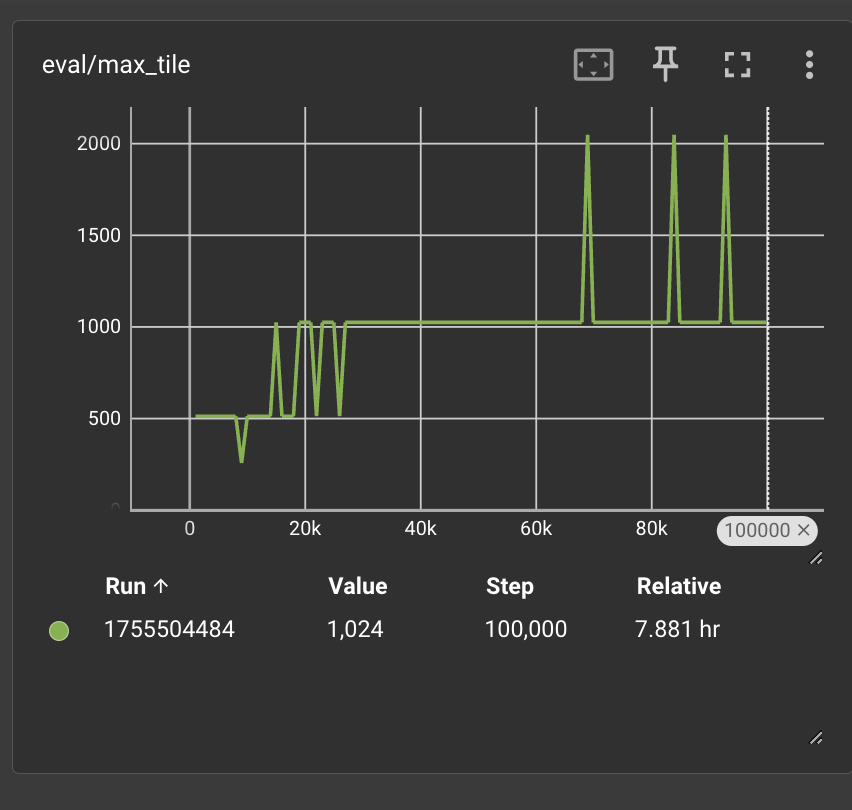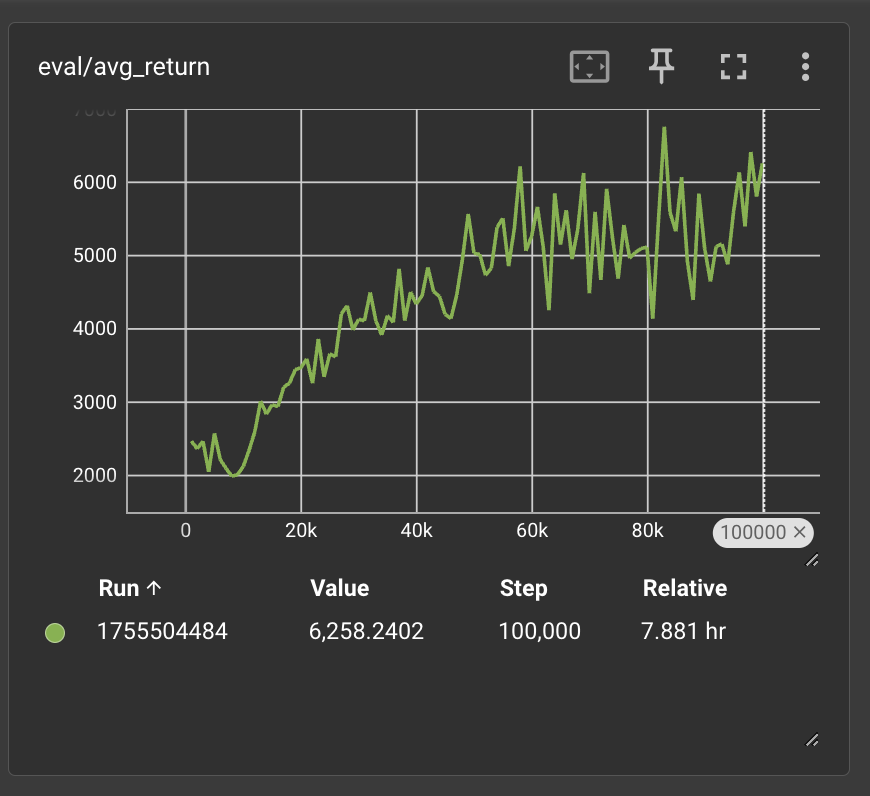

## Comparison to baseline agents

In [266]:
eval_eps = 1000

prev_best = [best_agent]
eval_returns = [ run_episode(env, prev_best, train=False) for _ in range(eval_eps) ]

r_agent = [random_agent.RandomAgent(0, num_actions, "Entropy Master 2000")]
r_eval_returns = [ run_episode(env, r_agent, train=False) for _ in range(eval_eps) ]

s_agent = [SimpleAgent(0, num_actions, "MinAgent")]
s_eval_returns = [ run_episode(env, s_agent, train=False) for _ in range(eval_eps) ]

c_agent = [CornerAgent(0, num_actions, "CornerAgent")]
c_eval_returns = [ run_episode(env, c_agent, train=False) for _ in range(eval_eps) ]

best_agent_performance = pd.DataFrame(eval_returns, columns=['return', 'steps', 'max_tile'])
rand_agent_performance = pd.DataFrame(r_eval_returns, columns=['return', 'steps', 'max_tile'])
simple_agent_performance = pd.DataFrame(s_eval_returns, columns=['return', 'steps', 'max_tile'])
corner_agent_performance = pd.DataFrame(c_eval_returns, columns=['return', 'steps', 'max_tile'])

best_agent_performance.describe()

,return,steps,max_tile
count,1000.000000,1000.000000,1000.000000
mean,5543.348000,380.258000,473.856000
std,3358.068715,177.853241,279.536889
min,400.000000,67.000000,32.000000
25%,2932.000000,242.000000,256.000000
50%,5124.000000,356.000000,512.000000
75%,7084.000000,484.250000,512.000000
max,20404.000000,974.000000,2048.000000


In [270]:
best_agent_performance['max_tile'].value_counts().sort_index()

,count
max_tile,
32.0,2
64.0,17
128.0,97
256.0,284
512.0,445
1024.0,154
2048.0,1


In [271]:
rand_agent_performance['max_tile'].value_counts().sort_index()

,count
max_tile,
16.0,2
32.0,71
64.0,384
128.0,466
256.0,77


In [272]:
simple_agent_performance['max_tile'].value_counts().sort_index()

,count
max_tile,
16.0,3
32.0,38
64.0,113
128.0,399
256.0,424
512.0,23


In [273]:
corner_agent_performance['max_tile'].value_counts().sort_index()

,count
max_tile,
16.0,1
32.0,20
64.0,130
128.0,419
256.0,415
512.0,15


# Agent Demonstration


In [325]:
eval_agents = [best_agent]
logging = True

time_step = env.reset()
total_eval_reward = 0
actions = []
action_names = []
while not time_step.last():
    player_id = time_step.observations["current_player"]
    agent_output = eval_agents[player_id].step(time_step, is_evaluation=True)
    actions.append(agent_output.action)
    action_names.append(env.get_state.action_to_string(agent_output.action))
    if logging:
        print("")
        print(env.get_state)
        print(f"Agent {player_id} chooses {env.get_state.action_to_string(agent_output.action)}")
    time_step = env.step([agent_output.action])
    total_eval_reward += time_step.rewards[player_id]

print("")
print(env.get_state)
print(total_eval_reward)


    0    0    0    2
    0    2    0    0
    0    0    0    0
    0    0    0    0

Agent 0 chooses Up

    0    2    0    2
    0    0    0    0
    0    0    2    0
    0    0    0    0

Agent 0 chooses Left

    4    0    0    0
    2    0    0    0
    2    0    0    0
    0    0    0    0

Agent 0 chooses Up

    4    0    0    2
    4    0    0    0
    0    0    0    0
    0    0    0    0

Agent 0 chooses Left

    4    2    0    0
    4    0    0    0
    0    0    0    2
    0    0    0    0

Agent 0 chooses Up

    8    2    0    2
    0    0    0    0
    0    0    0    0
    2    0    0    0

Agent 0 chooses Up

    8    2    0    2
    2    2    0    0
    0    0    0    0
    0    0    0    0

Agent 0 chooses Up

    8    4    0    2
    2    0    0    0
    2    0    0    0
    0    0    0    0

Agent 0 chooses Up

    8    4    0    2
    4    0    0    0
    0    0    0    2
    0    0    0    0

Agent 0 chooses Left

    8    4    2    2
    4    0    0    0
    2 

<Axes: >

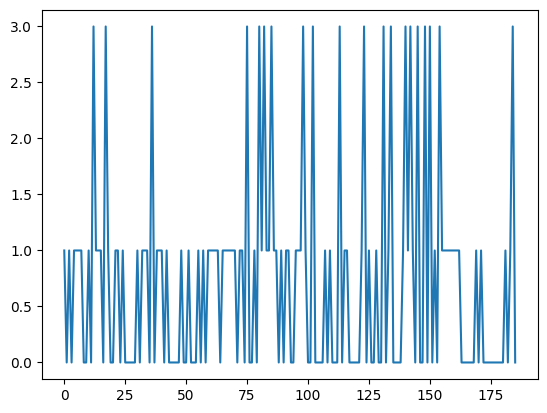

In [326]:

action_series = pd.Series(actions)
action_series += 1
action_series %= 4
action_series.plot()

In [316]:
action_names = pd.Series(action_names)
action_names.value_counts()

,count
Left,273
Up,175
Down,58


In [318]:
transitions = [action_names, action_names.shift(-1)]
action_df = pd.DataFrame(transitions).T
action_df.columns = ['action', 'next_action']

transition_counts = dict()
for action, next_action in zip(action_df['action'], action_df['next_action']):
    transition = (action, next_action)
    if type(next_action) == type(None):
        transition = (action, 'terminal')
    if transition in transition_counts:
        transition_counts[transition] += 1
    else:
        transition_counts[transition] = 1

pd.DataFrame(transition_counts.items(), columns=['transition', 'count']).sort_values(by='transition', ascending=True)

,transition,count
7,"(Down, Left)",35
5,"(Down, Up)",23
4,"(Left, Down)",29
3,"(Left, Left)",151
0,"(Left, Up)",93
6,"(Up, Down)",29
1,"(Up, Left)",86
2,"(Up, Up)",59
8,"(Up, terminal)",1


We can observe in the trajectory above, the agent is primarily choosing up and left as its preferred directions and then only chooses down when those other options aren't available. In many trajectories, it never chooses to move right. This is very similar to the popular human-style gameplay heuristic that focuses on accumulating your highest tile in a corner, as referenced [here](https://www.2048.org/strategy-tips/).


# Conclusions

This current architecture for solving 2048 with DQN is not entirely unsuccessful, however it does not produce an agent that consistently scores highly. For example, compare to the results in [this](https://stackoverflow.com/questions/22342854/what-is-the-optimal-algorithm-for-the-game-2048/23853848#23853848) StackOverflow post, which uses an incredibly naive heuristic-free AI, does not resemble human gameplay behavior, and consistently gets beyond the 2048 tile. The high dimensionality of the state space and long gameplay horizons seem to cap the performance of RL techniques for this environment.

That said, with relatively little "work", we can produce a bot that outperforms naive heuristic-based agents like random movement, basic corner-seeking algorithms, and even weak human gameplay.

## Future Work
I identified a few areas where I think the methodology could be improved that I believe go beyond the scope of this assignment.

First, I believe there is a horizon effect occurring that is limiting the efficacy of the agent. Getting very large tiles requires playing the game for much longer periods of time. It could be that the discount rate is forcing the agent to ignore those potentially large payoffs. We can also decrease the lower epsilon bound to allow for longer episodes in training. Additionally, since you need to play longer and get a much fuller grid to operate in states that will lead to high payoff, the agent is exposed to far more examples in the buffer and typical episodes with sparser grids. This could be combatted by selectively keeping certain transitions in the replay buffer longer if they increase the diversity of situations that the DQN is exposed to, in particular situations with high. With the improvements we have already seen setting the discount rate to 1.0 and the epsilon bound to 0.005, I believe we are on the right track to overcoming this hurdle. It could be that simply more training with the existing hyperparameters leads to an agent that is consistently able to produce high scoring games.

Second, I think the 2D nature of the environment is highly relevant to gameplay. It could be that a simple feed forward architecture is not ideal for this case. Potentially a CNN could yield better outcomes in identifying the structure of the game. I think potentially it could be useful to augment the input of the Q network with the output of a network whose only job is to guess the state of the board after the next action is taken. This could also be done programmatically by giving the agent access to a copy of the environment.

# Requirements
This notebook ran in a Google Colab Python3 runtime with Python=3.11.13 and access to a T4 GPU. It requires Tensorboard and OpenSpiel==1.6

In [7]:
# upload agent
# !tar -xvf 2048_ckpt.tar

content/checkpoints/
content/checkpoints/openspiel_dqn_2048/
content/checkpoints/openspiel_dqn_2048/1755429576/
content/checkpoints/openspiel_dqn_2048/1755429576/final.pt
content/checkpoints/openspiel_dqn_2048/1755429576/periodic_ep000050.json
content/checkpoints/openspiel_dqn_2048/1755429576/periodic_ep000050.pt
content/checkpoints/openspiel_dqn_2048/1755429576/best.pt
content/checkpoints/openspiel_dqn_2048/1755429576/periodic_ep000100.pt
content/checkpoints/openspiel_dqn_2048/1755429576/best.json
content/checkpoints/openspiel_dqn_2048/1755429576/final.json
content/checkpoints/openspiel_dqn_2048/1755429576/periodic_ep000100.json
content/checkpoints/openspiel_dqn_2048/1755429972/
content/checkpoints/openspiel_dqn_2048/1755429972/periodic_ep035000.pt
content/checkpoints/openspiel_dqn_2048/1755429972/periodic_ep032000.pt
content/checkpoints/openspiel_dqn_2048/1755429972/periodic_ep016000.pt
content/checkpoints/openspiel_dqn_2048/1755429972/final.pt
content/checkpoints/openspiel_dqn_2048/

# DQN and other agents

In [162]:
# Copyright 2019 DeepMind Technologies Limited
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

"""DQN agent implemented in PyTorch."""

import collections
import math
import numpy as np
from scipy import stats
import torch
from torch import nn
import torch.nn.functional as F

from open_spiel.python import rl_agent
from open_spiel.python.utils.replay_buffer import ReplayBuffer

Transition = collections.namedtuple(
    "Transition",
    "info_state action reward next_info_state is_final_step legal_actions_mask")

ILLEGAL_ACTION_LOGITS_PENALTY = torch.finfo(torch.float).min


class SonnetLinear(nn.Module):
  """A Sonnet linear module.

  Always includes biases and only supports ReLU activations.
  """

  def __init__(self, in_size, out_size, activate_relu=True):
    """Creates a Sonnet linear layer.

    Args:
      in_size: (int) number of inputs
      out_size: (int) number of outputs
      activate_relu: (bool) whether to include a ReLU activation layer
    """
    super(SonnetLinear, self).__init__()
    self._activate_relu = activate_relu
    stddev = 1.0 / math.sqrt(in_size)
    mean = 0
    lower = (-2 * stddev - mean) / stddev
    upper = (2 * stddev - mean) / stddev
    # Weight initialization inspired by Sonnet's Linear layer,
    # which cites https://arxiv.org/abs/1502.03167v3
    # pytorch default: initialized from
    # uniform(-sqrt(1/in_features), sqrt(1/in_features))
    self._weight = nn.Parameter(
        torch.Tensor(
            stats.truncnorm.rvs(
                lower, upper, loc=mean, scale=stddev, size=[out_size,
                                                            in_size])).to("cuda"))
    self._bias = nn.Parameter(torch.zeros([out_size]))

  def forward(self, tensor):
    y = F.linear(tensor, self._weight, self._bias)
    return F.relu(y) if self._activate_relu else y


class MLP(nn.Module):
  """A simple network built from nn.linear layers."""

  def __init__(self,
               input_size,
               hidden_sizes,
               output_size,
               activate_final=False):
    """Create the MLP.

    Args:
      input_size: (int) number of inputs
      hidden_sizes: (list) sizes (number of units) of each hidden layer
      output_size: (int) number of outputs
      activate_final: (bool) should final layer should include a ReLU
    """

    super(MLP, self).__init__()
    self._layers = []
    # Hidden layers
    for size in hidden_sizes:
      self._layers.append(SonnetLinear(in_size=input_size, out_size=size))
      input_size = size
    # Output layer
    self._layers.append(
        SonnetLinear(
            in_size=input_size,
            out_size=output_size,
            activate_relu=activate_final))

    self.model = nn.ModuleList(self._layers)

  def forward(self, x):
    for layer in self.model:
      x = layer(x)
    return x


class DQN(rl_agent.AbstractAgent):
  """DQN Agent implementation in PyTorch.

  See open_spiel/python/examples/breakthrough_dqn.py for an usage example.
  """

  def __init__(self,
               player_id,
               state_representation_size,
               num_actions,
               hidden_layers_sizes=128,
               replay_buffer_capacity=10000,
               batch_size=128,
               replay_buffer_class=ReplayBuffer,
               learning_rate=0.01,
               update_target_network_every=1000,
               learn_every=10,
               discount_factor=1.0,
               min_buffer_size_to_learn=1000,
               epsilon_start=1.0,
               epsilon_end=0.1,
               epsilon_decay_duration=int(1e6),
               optimizer_str="sgd",
               loss_str="mse"):
    """Initialize the DQN agent."""

    # This call to locals() is used to store every argument used to initialize
    # the class instance, so it can be copied with no hyperparameter change.
    self._kwargs = locals()

    self.player_id = player_id
    self._num_actions = num_actions
    if isinstance(hidden_layers_sizes, int):
      hidden_layers_sizes = [hidden_layers_sizes]
    self._layer_sizes = hidden_layers_sizes
    self._batch_size = batch_size
    self._update_target_network_every = update_target_network_every
    self._learn_every = learn_every
    self._min_buffer_size_to_learn = min_buffer_size_to_learn
    self._discount_factor = discount_factor

    self._epsilon_start = epsilon_start
    self._epsilon_end = epsilon_end
    self._epsilon_decay_duration = epsilon_decay_duration

    # TODO(author6) Allow for optional replay buffer config.
    if not isinstance(replay_buffer_capacity, int):
      raise ValueError("Replay buffer capacity not an integer.")
    self._replay_buffer = replay_buffer_class(replay_buffer_capacity)
    self._prev_timestep = None
    self._prev_action = None

    # Step counter to keep track of learning, eps decay and target network.
    self._step_counter = 0

    # Keep track of the last training loss achieved in an update step.
    self._last_loss_value = None

    # Create the Q-network instances
    self._q_network = MLP(state_representation_size, self._layer_sizes,
                          num_actions)

    self._target_q_network = MLP(state_representation_size, self._layer_sizes,
                                 num_actions)

    if loss_str == "mse":
      self.loss_class = F.mse_loss
    elif loss_str == "huber":
      self.loss_class = F.smooth_l1_loss
    else:
      raise ValueError("Not implemented, choose from 'mse', 'huber'.")

    if optimizer_str == "adam":
      self._optimizer = torch.optim.Adam(
          self._q_network.parameters(), lr=learning_rate)
    elif optimizer_str == "sgd":
      self._optimizer = torch.optim.SGD(
          self._q_network.parameters(), lr=learning_rate)
    else:
      raise ValueError("Not implemented, choose from 'adam' and 'sgd'.")

  def step(self, time_step, is_evaluation=False, add_transition_record=True):
    """Returns the action to be taken and updates the Q-network if needed.

    Args:
      time_step: an instance of rl_environment.TimeStep.
      is_evaluation: bool, whether this is a training or evaluation call.
      add_transition_record: Whether to add to the replay buffer on this step.

    Returns:
      A `rl_agent.StepOutput` containing the action probs and chosen action.
    """

    # Act step: don't act at terminal info states or if its not our turn.
    if (not time_step.last()) and (
        time_step.is_simultaneous_move() or
        self.player_id == time_step.current_player()):
      info_state = time_step.observations["info_state"][self.player_id]
      legal_actions = time_step.observations["legal_actions"][self.player_id]
      epsilon = self._get_epsilon(is_evaluation)
      action, probs = self._epsilon_greedy(info_state, legal_actions, epsilon)
    else:
      action = None
      probs = []

    # Don't mess up with the state during evaluation.
    if not is_evaluation:
      self._step_counter += 1

      if self._step_counter % self._learn_every == 0:
        self._last_loss_value = self.learn()

      if self._step_counter % self._update_target_network_every == 0:
        # state_dict method returns a dictionary containing a whole state of the
        # module.
        self._target_q_network.load_state_dict(self._q_network.state_dict())

      if self._prev_timestep and add_transition_record:
        # We may omit record adding here if it's done elsewhere.
        self.add_transition(self._prev_timestep, self._prev_action, time_step)

      if time_step.last():  # prepare for the next episode.
        self._prev_timestep = None
        self._prev_action = None
        return
      else:
        self._prev_timestep = time_step
        self._prev_action = action

    return rl_agent.StepOutput(action=action, probs=probs)

  def add_transition(self, prev_time_step, prev_action, time_step):
    """Adds the new transition using `time_step` to the replay buffer.

    Adds the transition from `self._prev_timestep` to `time_step` by
    `self._prev_action`.

    Args:
      prev_time_step: prev ts, an instance of rl_environment.TimeStep.
      prev_action: int, action taken at `prev_time_step`.
      time_step: current ts, an instance of rl_environment.TimeStep.
    """
    assert prev_time_step is not None
    legal_actions = (time_step.observations["legal_actions"][self.player_id])
    legal_actions_mask = np.zeros(self._num_actions)
    legal_actions_mask[legal_actions] = 1.0
    transition = Transition(
        info_state=(
            prev_time_step.observations["info_state"][self.player_id][:]),
        action=prev_action,
        reward=time_step.rewards[self.player_id],
        next_info_state=time_step.observations["info_state"][self.player_id][:],
        is_final_step=float(time_step.last()),
        legal_actions_mask=legal_actions_mask)
    self._replay_buffer.add(transition)

  def _epsilon_greedy(self, info_state, legal_actions, epsilon):
    """Returns a valid epsilon-greedy action and valid action probs.

    Action probabilities are given by a softmax over legal q-values.

    Args:
      info_state: hashable representation of the information state.
      legal_actions: list of legal actions at `info_state`.
      epsilon: float, probability of taking an exploratory action.

    Returns:
      A valid epsilon-greedy action and valid action probabilities.
    """
    probs = np.zeros(self._num_actions)
    if np.random.rand() < epsilon:
      action = np.random.choice(legal_actions)
      probs[legal_actions] = 1.0 / len(legal_actions)
    else:
      info_state = torch.Tensor(np.reshape(info_state, [1, -1])).to("cuda")
      q_values = self._q_network(info_state).detach()[0]
      legal_q_values = q_values[legal_actions]
      action = legal_actions[torch.argmax(legal_q_values)]
      probs[action] = 1.0
    return action, probs

  def _get_epsilon(self, is_evaluation, power=1.0):
    """Returns the evaluation or decayed epsilon value."""
    if is_evaluation:
      return 0.0
    decay_steps = min(self._step_counter, self._epsilon_decay_duration)
    decayed_epsilon = (
        self._epsilon_end + (self._epsilon_start - self._epsilon_end) *
        (1 - decay_steps / self._epsilon_decay_duration)**power)
    return decayed_epsilon

  def learn(self):
    """Compute the loss on sampled transitions and perform a Q-network update.

    If there are not enough elements in the buffer, no loss is computed and
    `None` is returned instead.

    Returns:
      The average loss obtained on this batch of transitions or `None`.
    """

    if (len(self._replay_buffer) < self._batch_size or
        len(self._replay_buffer) < self._min_buffer_size_to_learn):
      return None

    transitions = self._replay_buffer.sample(self._batch_size)
    info_states = torch.Tensor([t.info_state for t in transitions]).to("cuda")
    actions = torch.LongTensor([t.action for t in transitions]).to("cuda")
    rewards = torch.Tensor([t.reward for t in transitions]).to("cuda")
    next_info_states = torch.Tensor([t.next_info_state for t in transitions]).to("cuda")
    are_final_steps = torch.Tensor([t.is_final_step for t in transitions]).to("cuda")
    legal_actions_mask = torch.Tensor(
        np.array([t.legal_actions_mask for t in transitions])).to("cuda")

    self._q_values = self._q_network(info_states)
    self._target_q_values = self._target_q_network(next_info_states).detach()

    illegal_actions_mask = 1 - legal_actions_mask
    legal_target_q_values = self._target_q_values.masked_fill(
        illegal_actions_mask.bool(), ILLEGAL_ACTION_LOGITS_PENALTY
    )
    max_next_q = torch.max(legal_target_q_values, dim=1)[0]

    target = (
        rewards + (1 - are_final_steps) * self._discount_factor * max_next_q)
    action_indices = torch.stack([
        torch.arange(self._q_values.shape[0], dtype=torch.long).to("cuda"), actions
    ],
                                 dim=0).to("cuda")
    predictions = self._q_values[list(action_indices)]

    loss = self.loss_class(predictions, target)

    self._optimizer.zero_grad()
    loss.backward()
    self._optimizer.step()

    return loss

  @property
  def q_values(self):
    return self._q_values

  @property
  def replay_buffer(self):
    return self._replay_buffer

  @property
  def loss(self):
    return self._last_loss_value

  @property
  def prev_timestep(self):
    return self._prev_timestep

  @property
  def prev_action(self):
    return self._prev_action

  @property
  def step_counter(self):
    return self._step_counter

  def get_weights(self):
    variables = [m.weight for m in self._q_network.model]
    variables.append([m.weight for m in self._target_q_network.model])
    return variables

  def copy_with_noise(self, sigma=0.0, copy_weights=True):
    """Copies the object and perturbates it with noise.

    Args:
      sigma: gaussian dropout variance term : Multiplicative noise following
        (1+sigma*epsilon), epsilon standard gaussian variable, multiplies each
        model weight. sigma=0 means no perturbation.
      copy_weights: Boolean determining whether to copy model weights (True) or
        just model hyperparameters.

    Returns:
      Perturbated copy of the model.
    """
    _ = self._kwargs.pop("self", None)
    copied_object = DQN(**self._kwargs)

    q_network = getattr(copied_object, "_q_network")
    target_q_network = getattr(copied_object, "_target_q_network")

    if copy_weights:
      with torch.no_grad():
        for q_model in q_network.model:
          q_model.weight *= (1 + sigma * torch.randn(q_model.weight.shape))
        for tq_model in target_q_network.model:
          tq_model.weight *= (1 + sigma * torch.randn(tq_model.weight.shape))
    return copied_object

  def save(self, data_path, optimizer_data_path=None):
    """Save checkpoint/trained model and optimizer.

    Args:
      data_path: Path for saving model. It can be relative or absolute but the
        filename should be included. For example: q_network.pt or
        /path/to/q_network.pt
      optimizer_data_path: Path for saving the optimizer states. It can be
        relative or absolute but the filename should be included. For example:
        optimizer.pt or /path/to/optimizer.pt
    """
    torch.save(self._q_network, data_path)
    if optimizer_data_path is not None:
      torch.save(self._optimizer, optimizer_data_path)

  def load(self, data_path, optimizer_data_path=None):
    """Load checkpoint/trained model and optimizer.

    Args:
      data_path: Path for loading model. It can be relative or absolute but the
        filename should be included. For example: q_network.pt or
        /path/to/q_network.pt
      optimizer_data_path: Path for loading the optimizer states. It can be
        relative or absolute but the filename should be included. For example:
        optimizer.pt or /path/to/optimizer.pt
    """
    self._q_network = torch.load(data_path)
    self._target_q_network = torch.load(data_path)
    if optimizer_data_path is not None:
      self._optimizer = torch.load(optimizer_data_path)

In [ ]:


class SimpleAgent(rl_agent.AbstractAgent):
  """Simple agent class."""

  def __init__(self, player_id, num_actions, name="min_agent"):
    assert num_actions > 0
    self._player_id = player_id
    self._num_actions = num_actions

  def step(self, time_step, is_evaluation=False):
    # If it is the end of the episode, don't select an action.
    if time_step.last():
      return

    # Pick a random legal action.
    cur_legal_actions = time_step.observations["legal_actions"][self._player_id]
    action = np.min(cur_legal_actions)
    # probs = np.zeros(self._num_actions)
    # probs[cur_legal_actions] = 1.0 / len(cur_legal_actions)
    probs = np.ones(1)

    return rl_agent.StepOutput(action=action, probs=probs)

class CornerAgent(rl_agent.AbstractAgent):
  """Corner seeking agent class."""

  #Precedence is:
  #1. Alternate 0 and 1
  #2. If 0 not available and 1 not available, pick 2
  #3. If 0, 1, and 2 not available, pick 3

  def __init__(self, player_id, num_actions, name="min_agent"):
    assert num_actions > 0
    self._player_id = player_id
    self._num_actions = num_actions
    self.last_action = -1

  def step(self, time_step, is_evaluation=False):
    # If it is the end of the episode, don't select an action.
    if time_step.last():
      return

    # Pick a random legal action.
    cur_legal_actions = time_step.observations["legal_actions"][self._player_id]


    action = -1
    if 0 in cur_legal_actions and 1 in cur_legal_actions:
        if self.last_action == -1:
            action = 0
        elif self.last_action == 0:
            action = 1
        elif self.last_action == 1:
            action = 0
        else:
            action = 0
    elif 0 in cur_legal_actions:
        action = 0
    elif 1 in cur_legal_actions:
        action = 1
    elif 2 in cur_legal_actions:
        action = 2
    else:
        action = 3

    # probs = np.zeros(self._num_actions)
    # probs[cur_legal_actions] = 1.0 / len(cur_legal_actions)
    probs = np.ones(1)
    last_action = action

    return rl_agent.StepOutput(action=action, probs=probs)

# Train Functions

In [130]:

def _get_attr(obj, *names, default=None):
    """Return first existing attribute from names, else default."""
    for n in names:
        if hasattr(obj, n):
            return getattr(obj, n)
    return default

def _agent_state_dict(agent):
    """Extract a robust checkpoint payload for one agent."""
    net = _get_attr(agent, "q_network", "_q_network")
    optim = _get_attr(agent, "optimizer", "_optimizer", default=None)
    payload = {
        "q_network": net.state_dict() if net is not None else None,
        "optimizer": optim.state_dict() if optim is not None else None,
        "epsilon": _get_attr(agent, "epsilon", "_epsilon", default=None),
        "player_id": agent.player_id,
    }
    return payload

def _load_agent_state_dict(agent, payload, strict=True):
    net = _get_attr(agent, "q_network", "_q_network")
    optim = _get_attr(agent, "optimizer", "_optimizer", default=None)
    if payload.get("q_network") is not None and net is not None:
        net.load_state_dict(payload["q_network"], strict=strict)
    if payload.get("optimizer") is not None and optim is not None:
        optim.load_state_dict(payload["optimizer"])
    # try to restore epsilon if present
    if payload.get("epsilon") is not None and hasattr(agent, "epsilon"):
        agent.epsilon = float(payload["epsilon"])

def save_checkpoint(agents, meta, path):
    """Save a multi-agent checkpoint."""
    ckpt = {
        "meta": meta,
        "agents": [ _agent_state_dict(a) for a in agents ],
    }
    torch.save(ckpt, path)

    # also drop a small JSON alongside for quick peeks
    with open(Path(path).with_suffix(".json"), "w") as f:
        json.dump(meta, f, indent=2)

def load_checkpoint(agents, path, strict=True):
    ckpt = torch.load(path, map_location="cpu")
    for a, payload in zip(agents, ckpt["agents"]):
        _load_agent_state_dict(a, payload, strict=strict)
    return ckpt.get("meta", {})


def run_episode(env, agents, train=True, max_steps=10_000, device="cpu"):
    """Run one episode; returns (ep_return, ep_len)."""
    ts = env.reset()
    # ts = torch.tensor(env.reset(), dtype=torch.float32, device = device)
    ep_return = 0.0
    steps = 0
    while not ts.last() and steps < max_steps:
        pid = ts.observations["current_player"]
        # If your DQN supports eval flag, pass is_evaluation=not train.
        # Otherwise it will behave with its current epsilon.
        try:
            out = agents[pid].step(ts, is_evaluation=not train)
        except TypeError:
            out = agents[pid].step(ts)  # fallback if no flag
        ts = env.step([out.action])
        ep_return += float(ts.rewards[pid]) if ts.rewards is not None else 0.0
        steps += 1

    # Final step to let agents observe terminal transition
    for ag in agents:
        try:
            ag.step(ts, is_evaluation=not train)
        except TypeError:
            ag.step(ts)
    max_tile = np.max(ts.observations['info_state'])
    return ep_return, steps, max_tile

# Train Loop

In [234]:
# --- setup ---
env = rl_environment.Environment("2048")
num_players = env.num_players
num_actions = env.action_spec()["num_actions"]


In [230]:


# If you already have state_size, keep using it.

obs_spec = env.observation_spec()
if "info_state" in obs_spec:

    state_size = obs_spec["info_state"][0]
else:
    # fallback to flattened "tensor" observation if info_state is not provided
    shape = obs_spec["tensor"]["shape"]
    state_size = int(np.prod(shape))

dqn_cfg = dict(
    hidden_layers_sizes=[256, 256],        # if your impl only accepts an int, use 256
    replay_buffer_capacity=400_000,        # 100k–500k good; 200k is a solid start
    batch_size=128,                        # 64–128 typical
    replay_buffer_class=None,              # keep default (ReplayBuffer) by passing None or omit
    learning_rate=5e-5,                    # 5e-5–3e-4; 1e-4 is stable
    update_target_network_every=2_000,     # 2k–10k steps
    learn_every=10,                         # train every N env steps (default is 10; 4 is common)
    discount_factor=1.0,                  # 0.95–0.99; long horizon
    min_buffer_size_to_learn=20_000,       # warmup before learning
    epsilon_start=1.0,
    epsilon_end=0.005,
    epsilon_decay_duration=int(1e6),        # 100k–300k typical
    optimizer_str="adam",                  # your stub supports "sgd"; if "adam" isn’t implemented, use "sgd" with lr=1e-3
    loss_str="mse",                        # if "huber" isn’t available, keep "mse"
)

# # # --- Agents ---
agents = [
    DQN(
        player_id=i,
        state_representation_size=state_size,
        num_actions=num_actions,
        **{k: v for k, v in dqn_cfg.items() if v is not None}  # drop None safely
    )
    for i in range(num_players)
]
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# agents = [best_agent]

for ag in agents:
    ag._q_network.to(device)
    ag._target_q_network.to(device)
    print(next(ag._q_network.parameters()).device)


run_name = f"openspiel_dqn_2048/{int(time.time())}"
logdir = f"runs/{run_name}"
writer = SummaryWriter(log_dir=logdir)

ckpt_dir = Path(f"checkpoints/{run_name}")
ckpt_dir.mkdir(parents=True, exist_ok=True)



# --- training with logging ---
episodes = 100_000
eval_every = 1_000
ma_window = 100
eval_eps = 100
returns_ma = deque(maxlen=ma_window)

best_eval = 0


global_step = 0
for ep in range(1, episodes + 1):
    ep_return, ep_len, ep_tile = run_episode(env, agents, train=True, device=device)
    returns_ma.append(ep_return)
    global_step += ep_len  # stepwise x-axis (nice for TB)
    epsilon = agents[0]._get_epsilon(False)

    # Per-episode logs
    writer.add_scalar("train/episode_return", ep_return, ep)
    writer.add_scalar("train/episode_length", ep_len, ep)
    writer.add_scalar("train/max_tile", ep_tile, ep)
    writer.add_scalar("train/return_moving_avg", np.mean(returns_ma), ep)
    writer.add_scalar("train/epsilon", epsilon, ep)
    writer.add_scalar("train/return_moving_med", np.median(returns_ma), ep)

    # If your agent exposes epsilon or learning rate, log them:
    # (comment out if attribute not present)
    # if hasattr(agents[0], "epsilon"):
        # writer.add_scalar("train/epsilon", getattr(agents[0], "epsilon"), ep)

    # Periodic evaluation (greedy)
    if ep % eval_every == 0:
        eval_returns = [ run_episode(env, agents, train=False) for _ in range(eval_eps) ]
        eval = pd.DataFrame(eval_returns, columns=['return', 'steps', 'max_tile'])
        eval_avg = float(np.mean(eval['return']))
        eval_std = float(np.std(eval['return']))
        eval_max_tile = float(np.max(eval['max_tile']))
        writer.add_scalar("eval/avg_return", eval_avg, ep)
        writer.add_scalar("eval/std_return", eval_std, ep)
        writer.add_scalar("eval/max_tile", eval_max_tile, ep)

        print(f"[Episode {ep}] Returns MA100={np.mean(returns_ma):.3f} | {eval_eps} Ep Eval Avg={eval_avg:.3f}")


                # 1) Save periodic “rolling” checkpoint
        periodic_path = ckpt_dir / f"periodic_ep{ep:06d}.pt"
        save_checkpoint(
            agents,
            meta={
                "episode": ep,
                "eval_avg": eval_avg,
                "eval_std": eval_std,
                "moving_avg_100": float(np.mean(returns_ma)),
                "timestamp": time.time(),
            },
            path=periodic_path,
        )

        # 2) Save “best so far” checkpoint
        if eval_avg > best_eval:
            best_eval = eval_avg
            best_path = ckpt_dir / "best.pt"
            save_checkpoint(
                agents,
                meta={
                    "episode": ep,
                    "best_eval_avg": best_eval,
                    "moving_avg_100": float(np.mean(returns_ma)),
                    "timestamp": time.time(),
                },
                path=best_path,
            )
            writer.add_scalar("ckpt/best_eval", best_eval, ep)

# final save
final_path = ckpt_dir / "final.pt"
save_checkpoint(
    agents,
    meta={"episode": episodes, "moving_avg_100": float(np.mean(returns_ma)), "timestamp": time.time()},
    path=final_path,
)

writer.close()
print("Training complete. Logs in:", logdir)


cuda:0
[Episode 1000] Returns MA100=1003.120 | 100 Ep Eval Avg=2467.240
[Episode 2000] Returns MA100=1119.880 | 100 Ep Eval Avg=2363.280
[Episode 3000] Returns MA100=1212.480 | 100 Ep Eval Avg=2465.760
[Episode 4000] Returns MA100=1090.040 | 100 Ep Eval Avg=2047.920
[Episode 5000] Returns MA100=1172.520 | 100 Ep Eval Avg=2573.240
[Episode 6000] Returns MA100=1260.520 | 100 Ep Eval Avg=2215.200
[Episode 7000] Returns MA100=1419.960 | 100 Ep Eval Avg=2093.520
[Episode 8000] Returns MA100=1972.360 | 100 Ep Eval Avg=1989.200
[Episode 9000] Returns MA100=2205.000 | 100 Ep Eval Avg=2008.520
[Episode 10000] Returns MA100=1984.040 | 100 Ep Eval Avg=2123.480
[Episode 11000] Returns MA100=2449.160 | 100 Ep Eval Avg=2342.920
[Episode 12000] Returns MA100=2464.560 | 100 Ep Eval Avg=2598.600
[Episode 13000] Returns MA100=2884.720 | 100 Ep Eval Avg=3012.640
[Episode 14000] Returns MA100=2586.720 | 100 Ep Eval Avg=2836.520
[Episode 15000] Returns MA100=2934.880 | 100 Ep Eval Avg=2965.320
[Episode 160

In [327]:
# Download agents
# !tar -cvf 2048_ckpt_2.tar /content/checkpoints/
# from google.colab import files
# files.download("2048_ckpt_2.tar")

# TensorBoard

In [229]:
%tensorboard --logdir runs/openspiel_dqn_2048/

<IPython.core.display.Javascript object>

0

# Load Existing Agent

In [6]:
torch.cuda.is_available()

True

In [240]:

dqn_cfg = dict(
    hidden_layers_sizes=[256, 256],        # if your impl only accepts an int, use 256
    replay_buffer_capacity=400_000,        # 100k–500k good; 200k is a solid start
    batch_size=128,                        # 64–128 typical
    replay_buffer_class=None,              # keep default (ReplayBuffer) by passing None or omit
    learning_rate=5e-5,                    # 5e-5–3e-4; 1e-4 is stable
    update_target_network_every=2_000,     # 2k–10k steps
    learn_every=10,                         # train every N env steps (default is 10; 4 is common)
    discount_factor=0.99,                  # 0.95–0.99; long horizon
    min_buffer_size_to_learn=20_000,       # warmup before learning
    epsilon_start=0.05,
    epsilon_end=0.05,
    epsilon_decay_duration=int(1e7),        # 100k–300k typical
    optimizer_str="adam",                  # your stub supports "sgd"; if "adam" isn’t implemented, use "sgd" with lr=1e-3
    loss_str="mse",                        # if "huber" isn’t available, keep "mse"
)


best_agent = DQN(
        player_id=0,
        state_representation_size=state_size,
        num_actions=num_actions,
        **{k: v for k, v in dqn_cfg.items() if v is not None}  # drop None safely
    )



# best_path = "/content/checkpoints/openspiel_dqn_2048/1755504484/best.pt"
best_path = "best.pt" #pre-trained agent
loaded_agent = torch.load(best_path, map_location="cuda")
best_agent._q_network.load_state_dict(loaded_agent['agents'][0]['q_network'])
best_agent._q_network.eval()  #
best_agent._q_network.to(device)
best_agent._target_q_network.load_state_dict(loaded_agent['agents'][0]['q_network'])
best_agent._target_q_network.eval()  #
best_agent._target_q_network.to(device)



MLP(
  (model): ModuleList(
    (0-2): 3 x SonnetLinear()
  )
)

In [191]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_agent._q_network.to(device)
print(next(best_agent._q_network.parameters()).device)

cuda:0


In [324]:

eval_agents = [best_agent]

time_step = env.reset()
total_eval_reward = 0
while not time_step.last():
#   print("")
#   print(env.get_state)
  player_id = time_step.observations["current_player"]
  # Note the evaluation flag. A Q-learner will set epsilon=0 here.
  agent_output = eval_agents[player_id].step(time_step, is_evaluation=True)
#   print(f"Agent {player_id} chooses {agent_output.action}:{env.get_state.action_to_string(agent_output.action)}")
  time_step = env.step([agent_output.action])
  total_eval_reward += time_step.rewards[player_id]

print("")
print(env.get_state)
print(total_eval_reward)


   32   16    8    2
  256  128   32    4
  128   16    8    2
    4   32    2   16

3772.0


In [80]:
# !tar -xvf 2048_ckpt.tar